<a href="https://colab.research.google.com/github/ramayer/google-colab-examples/blob/main/elephant_inferrence_test.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Elephant Rumble Inference test notebook

Tests the pip installer for the AVES/HuBERT based elephant rumble classifier.

In [2]:
import os
if os.environ.get('COLAB_RELEASE_TAG'):
  if not os.path.exists("data"):
    from google.colab import drive
    drive.mount('/content/drive')
    os.symlink('/content/drive/MyDrive/AI for Forest Elephants 2 Shared/01. Data/cornell_data', "./data")

Mounted at /content/drive


## Install the package with `pip install`.

In [3]:
%pip install git+https://github.com/ramayer/elephant-rumble-inference@v0.1.3-demo

  Cloning https://github.com/ramayer/elephant-rumble-inference (to revision v0.1.3-demo) to /tmp/pip-req-build-co_e9f2a
  Running command git clone --filter=blob:none --quiet https://github.com/ramayer/elephant-rumble-inference /tmp/pip-req-build-co_e9f2a
  Running command git checkout -q b8d0c2952d132ada59cd699ccc2677add5aa8763
  Resolved https://github.com/ramayer/elephant-rumble-inference to commit b8d0c2952d132ada59cd699ccc2677add5aa8763
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.2/43.2 kB 712.2 kB/s eta 0:00:00
  Created wheel for elephant-rumble-inference: filename=elephant_rumble_inference-0.1.1-py3-none-any.whl size=12871 sha256=924735ce9007530dcdd11fd16e6bd8380ab0eec7517366c9b537bf2dd2e506ba
  Stored in directory: /tmp/pip-ephem-wheel-cache-vg3ywxdx/wheels/2a/71/62/0f89b2880a0f1f954fa943dc79bbc91c1c9047fb9972c7c1a1
Successfully built elep

## Run the command line tool.

In [4]:
!elephant-rumble-inference ./data/Rumble/Training/Sounds/CEB1_20111010_000000.wav \
   --save-classification-scores=/tmp/scores.pt \
   --save-visualizations=/tmp/vis.png \
   --limit-audio-hours=1 \
   --load-raven-files ./data/Rumble \
   --save-raven-file /tmp/new_labels.raven \
   --discrete-colormap

using cpu
WARNING - this can be extremely slow on the CPU - prepare to wait a long time
   Recommend running with --limit-audio-hours=1 
Model: None
Input files: ['./data/Rumble/Training/Sounds/CEB1_20111010_000000.wav']
fetching /root/.cache/torch/fruitpunch_elephants/aves-base-bio.torchaudio.model_config.json from https://storage.googleapis.com/esp-public-files/ported_aves/aves-base-bio.torchaudio.model_config.json
100% 999/999 [00:00<00:00, 3.06MB/s]
fetching /root/.cache/torch/fruitpunch_elephants/aves-base-bio.torchaudio.pt from https://storage.googleapis.com/esp-public-files/ported_aves/aves-base-bio.torchaudio.pt
100% 360M/360M [00:07<00:00, 52.8MB/s]
fetching /root/.cache/torch/fruitpunch_elephants/elephant_rumble_classifier_500_192_2024-06-29T23:39:01.415771_valloss=5.83.pth from https://0ape.com/pretrained_models/elephant_rumble_classifier_500_192_2024-06-29T23:39:01.415771_valloss=5.83.pth
100% 581k/581k [00:00<00:00, 3.80MB/s]
processing hour 0 of ./data/Rumble/Training/Sou

## Show the results

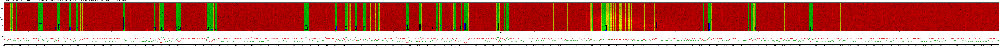

In [5]:
from PIL import Image
Image.open("/tmp/vis.png_00.png")

## Show the Raven File of the green sections

In [6]:
!head /tmp/new_labels.raven

Selection,View,Channel,Begin Time (s),End Time (s),Low Freq (Hz),High Freq (Hz),Begin Date,Begin Hour,Begin Path,Begin File,File Offset (s),Date Check,Time Check,Score,Tags,Notes,column17,raven_filename,Analyst,Verification_2,OLD-Selection,Site,Channel-OLD,hour,file date,date(raven),Tag 1,Tag 2,fileDate,Begin Path - old
0,Spectrogram 1,01,24.32,31.36,5,250,01/01/1970,00,./data/Rumble/Training/Sounds/CEB1_20111010_000000.wav,./data/Rumble/Training/Sounds/CEB1_20111010_000000.wav,24.32,01/01/1970,00:00:00.000,1,Maybe Rumble,Maybe Rumble,Maybe Rumble,possible_rumbles.txt,,,,,,,,,Maybe Rumble,Maybe Rumble,,
1,Spectrogram 1,01,45.44,49.28,5,250,01/01/1970,00,./data/Rumble/Training/Sounds/CEB1_20111010_000000.wav,./data/Rumble/Training/Sounds/CEB1_20111010_000000.wav,45.44,01/01/1970,00:00:00.000,1,Maybe Rumble,Maybe Rumble,Maybe Rumble,possible_rumbles.txt,,,,,,,,,Maybe Rumble,Maybe Rumble,,
2,Spectrogram 1,01,126.08,142.08,5,250,01/01/1970,00,./data/Rumble/Training/Sounds/CEB1_20111010_000

## Show more CLI options

In [7]:
!elephant-rumble-inference --help

using cpu
WARNING - this can be extremely slow on the CPU - prepare to wait a long time
   Recommend running with --limit-audio-hours=1 
usage: Usage:
        elephant-rumble-inference  /tmp/test.wav \
          --save-classification-scores=/tmp/scores.pt \
          --save-visualizations=/tmp/vis.png \
          --limit-audio-hours=1 \
          --discrete-colormap \
          --load-raven-files ~/proj/elephantlistening/data/Rumble \
          --save-raven-file=/tmp/generated_labels.raven
    

Find elephant rumbles in an audio clip

positional arguments:
  input_files           List of input files

options:
  -h, --help            show this help message and exit
  --model MODEL         Specify the model name
  --save-visualizations SAVE_VISUALIZATIONS
                        Save visualizations to a file (optional)
  --save-classification-scores SAVE_CLASSIFICATION_SCORES
                        Save classification scores to a file (optional)
  --save-raven-file SAVE_RAVEN_FILE
     